# Parallel Deep Learning for Liver Tumor Segmentation
- **Background**
Liver tumors are among the most serious forms of cancer, with early detection and accurate segmentation being crucial for effective treatment. Leveraging deep learning in medical imaging has proven effective for such tasks, but training models on large-scale imaging data is computationally intensive. In this project, we aim to build a liver tumor detection model using a high-performance computing (HPC) cluster, which allows us to scale up the computational demands needed for processing complex imaging datasets.
- **Motivations**
The primary motivation for this project is to accelerate the process of liver tumor detection in medical imaging, enabling faster and more accurate diagnoses. Traditional methods are computationally prohibitive due to the high volume and complexity of medical imaging data. By leveraging parallel computing on an HPC cluster, we can process vast amounts of imaging data efficiently and improve model accuracy through more complex and comprehensive models.
- **Goal**
Our goal is to develop a high-performance, parallelized liver tumor detection model that can accurately segment liver tumors in CT scans. We aim to reduce computation time and enhance accuracy by implementing advanced parallel machine learning and deep learning techniques on an HPC cluster.


## Dataset Details

### Description
- **Name:** Liver Tumor Segmentation
- **Type:** Image
- **Format:** NIfTI (Neuroimaging Informatics Technology Initiative) files
- **Size:** 53.66 GB

### Source
Source of the dataset:
- **Link:**
  - [Liver Tumor Segmentation - Part 1](https://www.kaggle.com/datasets/andrewmvd/liver-tumor-segmentation)
  - [Liver Tumor Segmentation - Part 2](https://www.kaggle.com/datasets/andrewmvd/liver-tumor-segmentation-part-2)



In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import glob
import nibabel as nb
import imageio
from tqdm.notebook import tqdm
from ipywidgets import *
from PIL import Image
from fastai.basics import *
from fastai.vision.all import *
from fastai.data.transforms import *
import random
from matplotlib.pyplot import figure
import nibabel as nib
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torchvision
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from torchvision import transforms

from PIL import Image

from tqdm import tqdm

from multiprocessing import Pool
import time
from dask.distributed import Client
import dask
from dask.distributed import performance_report
CUDA_LAUNCH_BLOCKING = 1 

In [2]:
data_path = '/courses/CSYE7105.202510/students/gaali.v/Final-Project/data'

In [3]:
files=[]
for dirname, _, filenames in os.walk(data_path):
    for filename in filenames:
      files.append((dirname, filename))
print(len(files))

47841


## Parallel Processing with Dask for File Transfer

**Objective:**
This demonstrates how to use **Dask** for parallelizing file transfer tasks. By utilizing multiple CPU cores, the performance of file operations (e.g., copying files between directories) can be significantly improved.

In [4]:
import os
import shutil


# Define the parent directory and target directory
parent_dir = data_path
target_dir = os.path.join(parent_dir, "Volume")

# Ensure the target directory exists
os.makedirs(target_dir, exist_ok=True)

# Define the function to process each segment
def process_segment(segment_index):
    source_dir = os.path.join(parent_dir, f"volume_pt{segment_index}")
    if os.path.exists(source_dir):
        for file_name in os.listdir(source_dir):
            source_file = os.path.join(source_dir, file_name)
            if os.path.isfile(source_file):  # Move files only
                shutil.copy(source_file, target_dir)
    return f"Segment {segment_index} processed."


In [5]:
from multiprocessing import Pool
import time
from dask.distributed import Client
import dask
from dask.distributed import performance_report

# Number of CPUs to test
cpu_counts = [1, 2, 4, 8]

# Segments to process
segments = range(1, 9)

execution_times = []
for cpus in cpu_counts:
    print(f"Running with {cpus} CPU(s):")
    start_time = time.time()  # Start the timer
    with Pool(processes=cpus) as pool:
        results = pool.map(process_segment, segments)
    end_time = time.time()  # End the timer
    elapsed_time = end_time - start_time 
    execution_times.append(elapsed_time)
    for result in results:
        print(result)
    print("-" * 50)

Running with 1 CPU(s):
Segment 1 processed.
Segment 2 processed.
Segment 3 processed.
Segment 4 processed.
Segment 5 processed.
Segment 6 processed.
Segment 7 processed.
Segment 8 processed.
--------------------------------------------------
Running with 2 CPU(s):
Segment 1 processed.
Segment 2 processed.
Segment 3 processed.
Segment 4 processed.
Segment 5 processed.
Segment 6 processed.
Segment 7 processed.
Segment 8 processed.
--------------------------------------------------
Running with 4 CPU(s):
Segment 1 processed.
Segment 2 processed.
Segment 3 processed.
Segment 4 processed.
Segment 5 processed.
Segment 6 processed.
Segment 7 processed.
Segment 8 processed.
--------------------------------------------------
Running with 8 CPU(s):
Segment 1 processed.
Segment 2 processed.
Segment 3 processed.
Segment 4 processed.
Segment 5 processed.
Segment 6 processed.
Segment 7 processed.
Segment 8 processed.
--------------------------------------------------


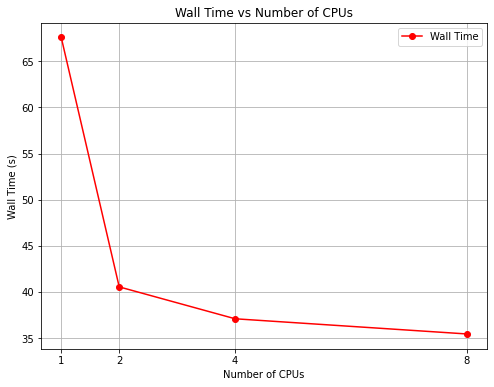

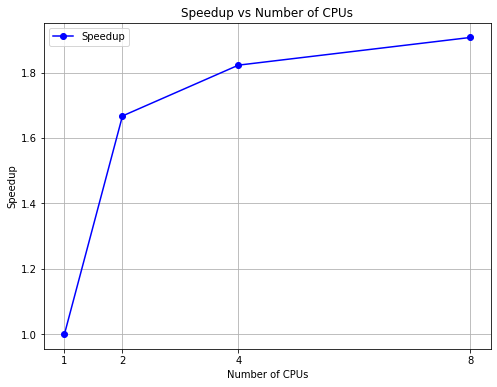

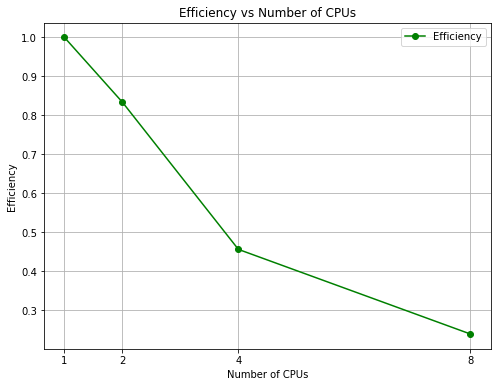

In [6]:
speedups = [execution_times[0] / time for time in execution_times]

# Calculate efficiencies
efficiencies = [speedup / cpu_count for speedup, cpu_count in zip(speedups, cpu_counts)]

# Plotting Wall Time
plt.figure(figsize=(8, 6))
plt.plot(cpu_counts, execution_times, marker='o', label='Wall Time', color='red')
plt.title('Wall Time vs Number of CPUs')
plt.xlabel('Number of CPUs')
plt.ylabel('Wall Time (s)')
plt.grid(True)
plt.xticks(cpu_counts)
plt.legend()
plt.show()

# Plotting Speedup
plt.figure(figsize=(8, 6))
plt.plot(cpu_counts, speedups, marker='o', label='Speedup', color='blue')
plt.title('Speedup vs Number of CPUs')
plt.xlabel('Number of CPUs')
plt.ylabel('Speedup')
plt.grid(True)
plt.xticks(cpu_counts)
plt.legend()
plt.show()

# Plotting Efficiency
plt.figure(figsize=(8, 6))
plt.plot(cpu_counts, efficiencies, marker='o', label='Efficiency', color='green')
plt.title('Efficiency vs Number of CPUs')
plt.xlabel('Number of CPUs')
plt.ylabel('Efficiency')
plt.grid(True)
plt.xticks(cpu_counts)
plt.legend()
plt.show()



In [7]:
vol_dir= data_path+ "/Volume/"
seg_dir=data_path + "/segmentations/"

In [8]:
def read_nii(filepath):
    ct_scan = nb.load(filepath)
    array = ct_scan.get_fdata()
    array = np.rot90(np.array(array))
    return(array)

## Loading and Displaying Medical Imaging Data
This code demonstrates how to read NIfTI files, analyze their shapes, and visualize a slice of a CT scan using a specific window setting for intensity normalization.

In [9]:
sample = 0
i=0
ct = f"volume-{i}.nii"
seg = f"segmentation-{i}.nii"
sample_ct = read_nii(vol_dir+ ct)

sample_mask = read_nii(seg_dir+seg)

print(f'CT Shape:   {sample_ct.shape}\nMask Shape: {sample_mask.shape}')

CT Shape:   (512, 512, 75)
Mask Shape: (512, 512, 75)


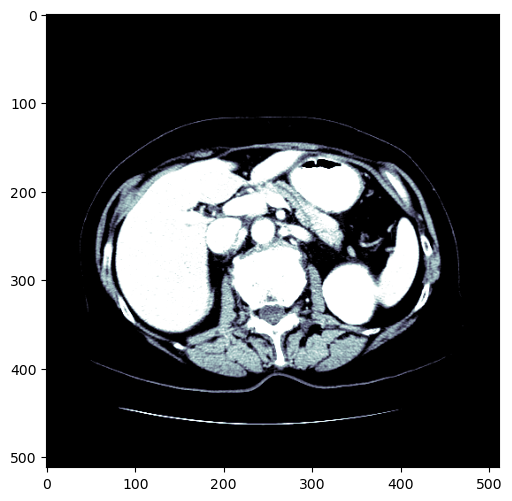

In [10]:
dicom_windows = types.SimpleNamespace(
    brain=(80,40),
    subdural=(254,100),
    stroke=(8,32),
    brain_bone=(2800,600),
    brain_soft=(375,40),
    lungs=(1500,-600),
    mediastinum=(350,50),
    abdomen_soft=(400,50),
    liver=(150,30),
    spine_soft=(250,50),
    spine_bone=(1800,400),
    custom = (200,60)
)

@patch
def windowed(self:Tensor, w, l):
    px = self.clone()
    px_min = l - w//2
    px_max = l + w//2
    px[px<px_min] = px_min
    px[px>px_max] = px_max
    return (px-px_min) / (px_max-px_min)

figure(figsize=(8, 6), dpi=100)
plt.imshow(tensor(sample_ct[..., 55].astype(np.float32)).windowed(*dicom_windows.liver), cmap=plt.cm.bone)


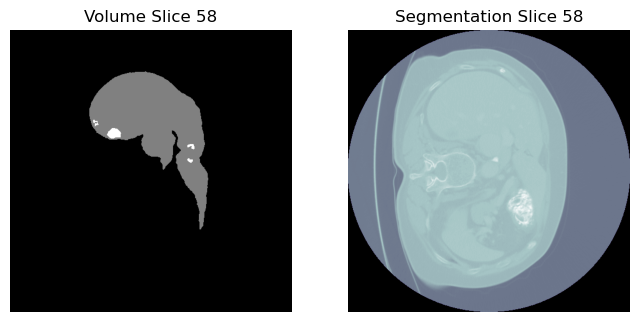

In [11]:
volume_nifti = nib.load(data_path + '/segmentations/segmentation-0.nii')

segmentation_nifti = nib.load(data_path + '/Volume/volume-0.nii')

volume_data = volume_nifti.get_fdata()
segmentation_data = segmentation_nifti.get_fdata()

slice_index = 58
figure(figsize=(8, 6), dpi=100)

plt.subplot(1, 2, 1)
plt.imshow(volume_data[..., slice_index], cmap='gray')
plt.title('Volume Slice {}'.format(slice_index))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmentation_data[..., slice_index], cmap='bone')
plt.title('Segmentation Slice {}'.format(slice_index))
plt.axis('off')

plt.show()


In [12]:
def plot_sample(array_list, color_map = 'binary'):
    '''
    Plots and a slice with all available annotations
    '''
    fig = plt.figure(figsize=(20,16), dpi=100)

    plt.subplot(1,4,1)
    plt.imshow(array_list[0], cmap='bone')
    plt.title('Original Image')
    plt.axis('off')
    plt.subplot(1,4,2)
    plt.imshow(tensor(array_list[0].astype(np.float32)).windowed(*dicom_windows.liver), cmap='bone');
    plt.title('Windowed Image')
    plt.axis('off')

    plt.subplot(1,4,3)
    plt.imshow(array_list[1], alpha=0.5, cmap=color_map)
    plt.title('Mask')
    plt.axis('off')

    plt.subplot(1,4,4)
    plt.imshow(array_list[0], cmap='bone')
    plt.imshow(array_list[1], alpha=0.5, cmap=color_map)
    plt.title('Liver & Mask')
    plt.axis('off')

    plt.show()

In [13]:
def get_ct_and_mask(idx):
    '''
    Loads the CT scan and segmentation mask for the given index.

    Parameters:
        idx: Index of the desired CT and mask pair.

    Returns:
        ct: The CT scan volume.
        mask: The segmentation mask volume.
        file_name: The file name for reference.
        dim: The number of slices in the CT scan.
    '''
    ct = read_nii(vol_dir+ '/' + f"volume-{idx}.nii")
    mask = read_nii(seg_dir+ '/' + f"segmentation-{idx}.nii")
    file_name ="volume-"+str(idx)
    dim = ct.shape[2]
    return ct, mask, file_name, dim

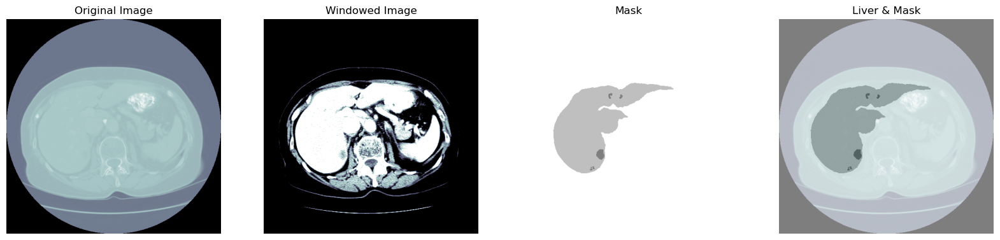

In [14]:
sample = 58
idx = 0
sample_ct, sample_mask,file_name, dim= get_ct_and_mask(idx)

sample_slice = tensor(sample_ct[...,sample].astype(np.float32))

plot_sample([sample_ct[..., sample],
             sample_mask[..., sample]])

### 1. Dataset Splitting
This section splits the data into three subsets: training, validation, and testing. The distribution is based on the total number of files in the directory:
- **Training Set**: 60% of the total data
- **Validation Set**: 20% of the total data
- **Test Set**: 20% of the total data

In [15]:
import os

def count_files_hpc(directory):
    return sum(len(files) for _, _, files in os.walk(directory))

print(f"Number of files: {count_files_hpc(vol_dir)}")


Number of files: 131


In [16]:
train_size = round(count_files_hpc(vol_dir)*3/5) # 60% for training 
val_data_dir = data_path+"/val"
val_size = round(count_files_hpc(vol_dir) *1/5) # 20% for validation
test_data_dir = data_path + "test/"
test_size = round(count_files_hpc(vol_dir) *1/5) # 20% for testing

In [17]:
train_size


79

In [18]:
def save_images_task(args):
    """
    Task wrapper to parallelize the saving of CT slices and masks.

    Parameters:
        args: A tuple (from_idx, to_idx, dir) where:
              - from_idx: Starting index of the CT volumes.
              - to_idx: Ending index of the CT volumes.
              - dir: Directory path to save the data.
    """
    from_idx, to_idx, dir = args
    data_dir = dir + '/data'
    labels_dir = dir + '/labels'
    if not os.path.exists(data_dir):
        os.makedirs(data_dir)
    if not os.path.exists(labels_dir):
        os.makedirs(labels_dir)
    for i in tqdm(range(from_idx, to_idx)):
        curr_ct, curr_mask, curr_file_name, curr_dim = get_ct_and_mask(i)
        for curr_slice in range(0, curr_dim, 10):
            data = curr_ct[..., curr_slice]
            mask = curr_mask[..., curr_slice] * 255 / 2
            im_data = Image.fromarray(data).convert('L')
            im_mask = Image.fromarray(mask).convert('L')
            path_data = f"{data_dir}/{curr_file_name}_slice_{curr_slice}.jpg"
            path_label = f"{labels_dir}/{curr_file_name}_slice_{curr_slice}.jpg"
            im_data.save(path_data)
            im_mask.save(path_label)


### Parallel Image-Slicing process
The dataset splitting and image-saving process is parallelized across multiple CPUs. The performance of the task is measured for different CPU counts.

In [19]:
cpu_counts = [1, 2, 4, 8]

excuted_times = []


for cpu in cpu_counts:
    train_data_dir = data_path + "/train"+str(cpu)

    val_data_dir = data_path + "/val"+str(cpu)
    
    test_data_dir = data_path + "/test"+ str(cpu)
    
    tasks = [
        (0, train_size, train_data_dir),
        (train_size, train_size + val_size, val_data_dir),
        (train_size+val_size, 131, test_data_dir)
    ]
    print(f"Running with {cpu} CPU(s):")
    
    # Initialize Dask Client with the specified number of workers
    with Client(n_workers=cpu) as client:
        print(client)
        # Generate a performance report
        with performance_report(filename=f"report_{cpu}_cpus.html"):
            start_time = time.time()
            with Pool(processes = cpu) as pool:
                pool.map(save_images_task, tasks)
            end_time = time.time()
            excuted_times.append(end_time-start_time)

Running with 1 CPU(s):
<Client: 'tcp://127.0.0.1:33755' processes=1 threads=4, memory=32.00 GiB>


100%|██████████| 26/26 [02:08<00:00,  4.94s/it]


Running with 2 CPU(s):
<Client: 'tcp://127.0.0.1:40231' processes=2 threads=4, memory=32.00 GiB>


100%|██████████| 26/26 [01:56<00:00,  4.46s/it]


Running with 4 CPU(s):
<Client: 'tcp://127.0.0.1:45624' processes=4 threads=4, memory=32.00 GiB>


100%|██████████| 79/79 [02:33<00:00,  1.95s/it]


Running with 8 CPU(s):
<Client: 'tcp://127.0.0.1:46022' processes=8 threads=8, memory=32.00 GiB>


100%|██████████| 79/79 [02:41<00:00,  2.04s/it]


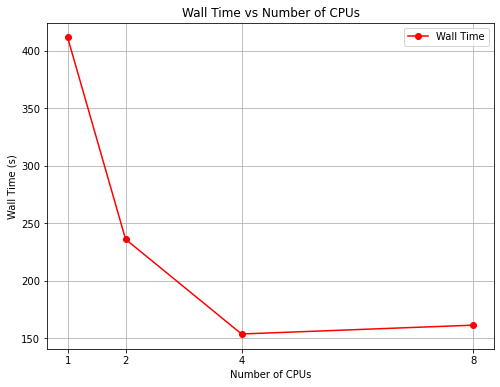

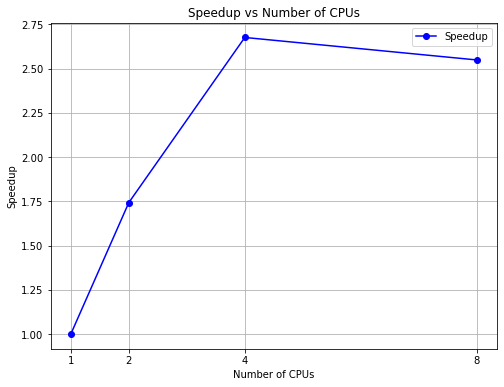

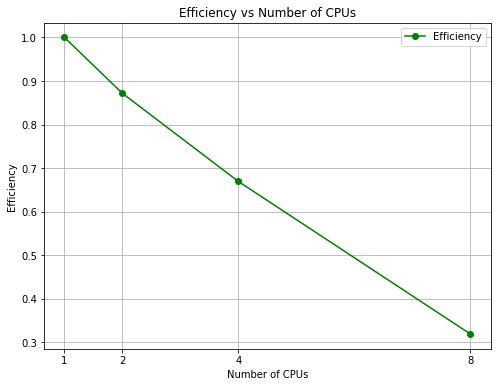

In [20]:
# Calculate speedup relative to single CPU performance
speedups = [excuted_times[0] / time for time in excuted_times]
# Calculate efficiencies
efficiencies = [speedup / cpu_count for speedup, cpu_count in zip(speedups, cpu_counts)]

# Plotting Wall Time
plt.figure(figsize=(8, 6))
plt.plot(cpu_counts, excuted_times, marker='o', label='Wall Time', color='red')
plt.title('Wall Time vs Number of CPUs')
plt.xlabel('Number of CPUs')
plt.ylabel('Wall Time (s)')
plt.grid(True)
plt.xticks(cpu_counts)
plt.legend()
plt.show()

# Plotting Speedup
plt.figure(figsize=(8, 6))
plt.plot(cpu_counts, speedups, marker='o', label='Speedup', color='blue')
plt.title('Speedup vs Number of CPUs')
plt.xlabel('Number of CPUs')
plt.ylabel('Speedup')
plt.grid(True)
plt.xticks(cpu_counts)
plt.legend()
plt.show()

# Plotting Efficiency
plt.figure(figsize=(8, 6))
plt.plot(cpu_counts, efficiencies, marker='o', label='Efficiency', color='green')
plt.title('Efficiency vs Number of CPUs')
plt.xlabel('Number of CPUs')
plt.ylabel('Efficiency')
plt.grid(True)
plt.xticks(cpu_counts)
plt.legend()
plt.show()

In [21]:
!python LiverSegmentation-Final-p.py

Currently running on 1 GPUs 
Running GPU 0 (rank 0)
Epoch 1/20
Train Loss: 0.3726, Validation Loss: 0.3668, Validation Accuracy: 0.9623        
Epoch 2/20
Train Loss: 0.2787, Validation Loss: 0.3383, Validation Accuracy: 0.9725        
Epoch 3/20
Train Loss: 0.2569, Validation Loss: 0.3176, Validation Accuracy: 0.9662        
Epoch 4/20
Train Loss: 0.2230, Validation Loss: 0.2907, Validation Accuracy: 0.9745        
Epoch 5/20
Train Loss: 0.2066, Validation Loss: 0.2911, Validation Accuracy: 0.9837        
Epoch 6/20
Train Loss: 0.1965, Validation Loss: 0.3111, Validation Accuracy: 0.9878        
Epoch 7/20
Train Loss: 0.1822, Validation Loss: 0.4745, Validation Accuracy: 0.9892        
Epoch 8/20
Train Loss: 0.1729, Validation Loss: 0.3149, Validation Accuracy: 0.9888        
Epoch 9/20
Train Loss: 0.1672, Validation Loss: 0.4045, Validation Accuracy: 0.9900        
Epoch 10/20
Train Loss: 0.1621, Validation Loss: 0.5301, Validation Accuracy: 0.9903        
Epoch 11/20
Train Loss: 0.1

In [22]:
def print_saved_files(directory='saved_results'):
    """
    Reads and visualizes the saved input images, masks, and predictions.

    Args:
        directory (str): Directory where the saved numpy files are stored.
    """
    # Check if the directory exists
    if not os.path.exists(directory):
        print(f"Directory '{directory}' does not exist.")
        return

    # List all files in the directory
    files = os.listdir(directory)
    if not files:
        print(f"No files found in the directory '{directory}'.")
        return

    # Separate files by type
    input_files = sorted([f for f in files if 'input_image' in f])
    mask_files = sorted([f for f in files if 'mask' in f])
    output_files = sorted([f for f in files if 'output' in f])

    # Iterate over the files and plot their content
    for input_file, mask_file, output_file in zip(input_files, mask_files, output_files):
        input_path = os.path.join(directory, input_file)
        mask_path = os.path.join(directory, mask_file)
        output_path = os.path.join(directory, output_file)

        input_image = np.load(input_path)
        mask = np.load(mask_path)
        output_pred = np.load(output_path)

        # Take the first item in the batch (batch size is 32)
        input_image = input_image[0]
        mask = mask[0]
        output_pred = output_pred[0]

        # Convert input image from CHW to HWC if needed
        if input_image.ndim == 3 and input_image.shape[0] == 1:
            input_image = input_image.squeeze(0)  # Convert single-channel image
        elif input_image.ndim == 3 and input_image.shape[0] == 3:
            input_image = input_image.transpose(1, 2, 0)  # Convert from CHW to HWC

        # Squeeze mask and output prediction if they have a channel dimension
        if mask.ndim == 3 and mask.shape[0] == 1:
            mask = mask.squeeze(0)
        if output_pred.ndim == 3 and output_pred.shape[0] == 1:
            output_pred = output_pred.squeeze(0)

        # Plot the input image, mask, and prediction overlay
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(input_image, cmap='gray')
        axes[0].set_title('Input Image')
        axes[0].axis('off')

        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title('Ground Truth Mask')
        axes[1].axis('off')

        axes[2].imshow(input_image, cmap='gray')
        axes[2].imshow(output_pred, cmap='Greens', alpha=0.6)
        axes[2].set_title('Input Image with Predicted Mask')
        axes[2].axis('off')

        plt.tight_layout()
        plt.show()

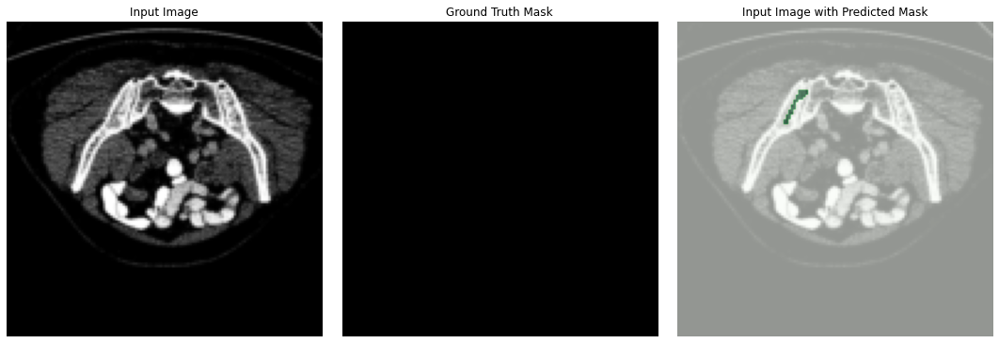

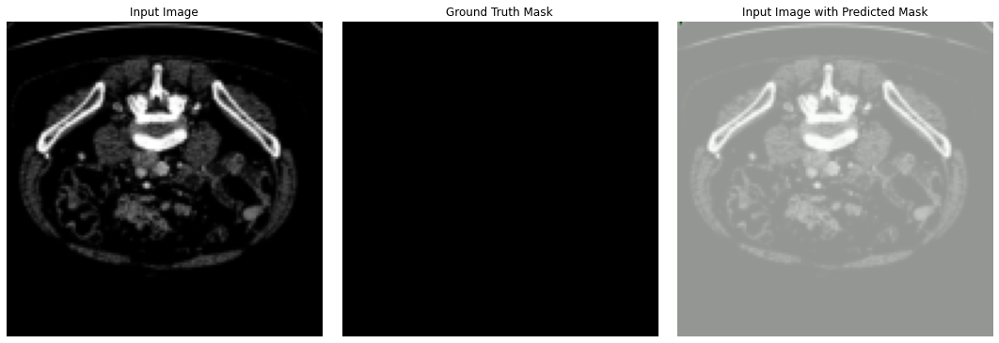

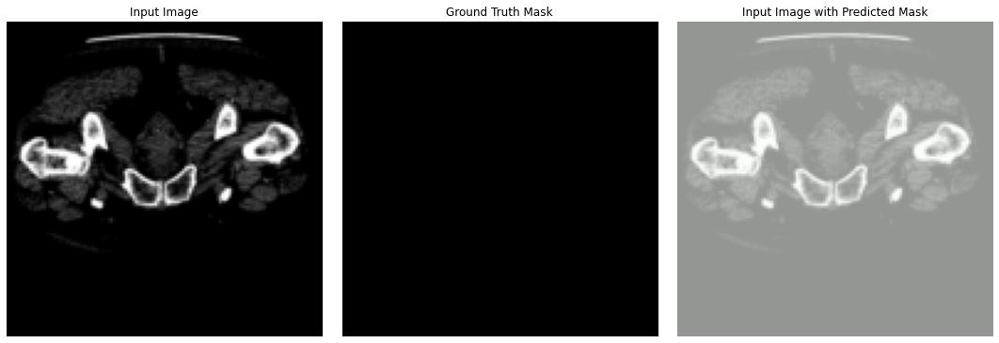

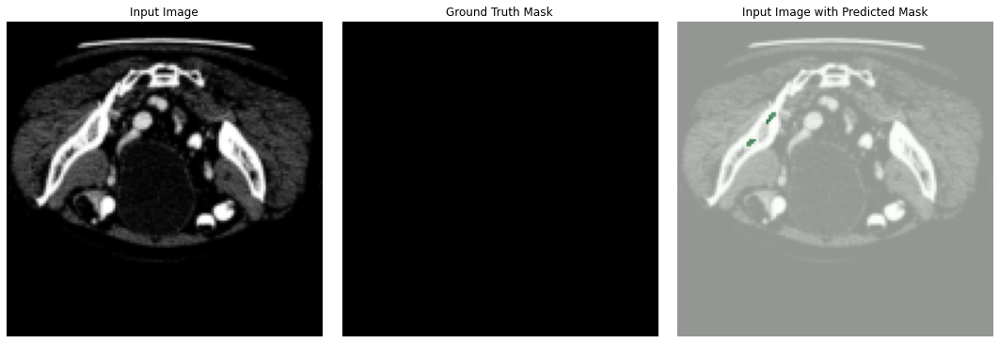

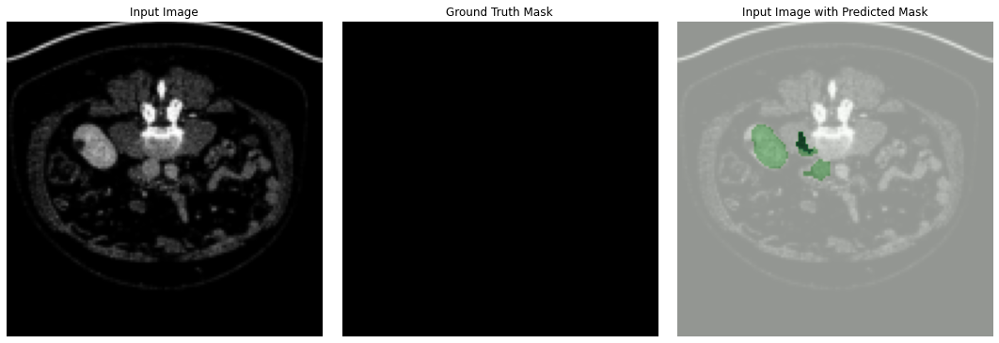

...

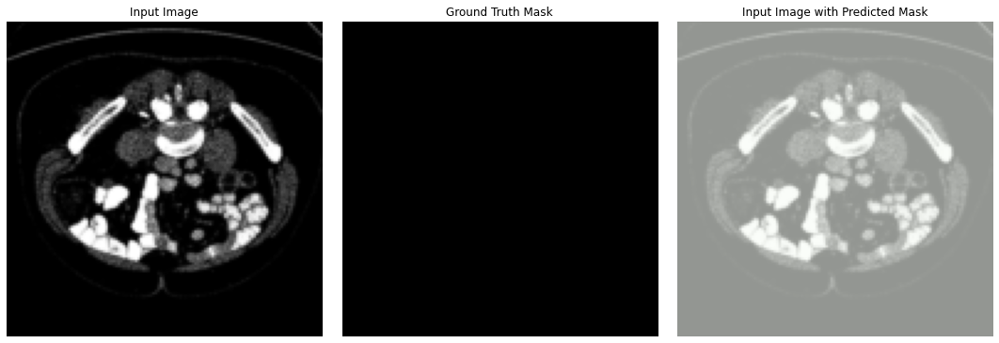

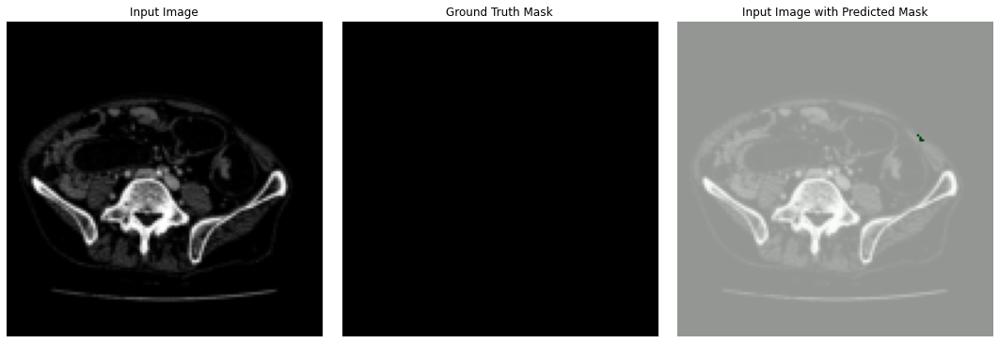

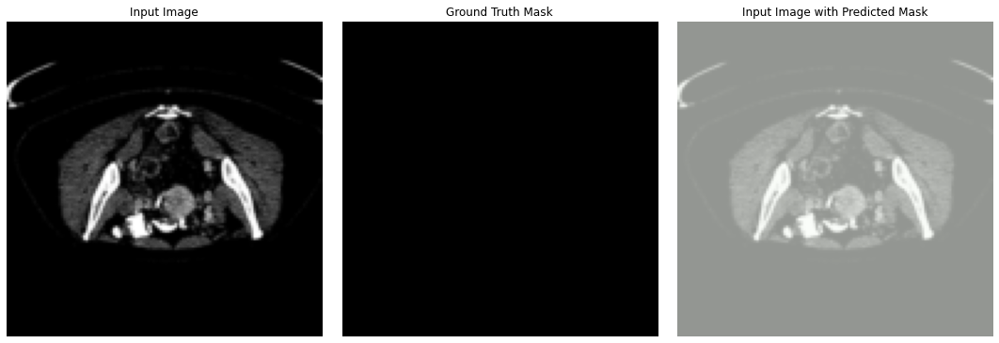

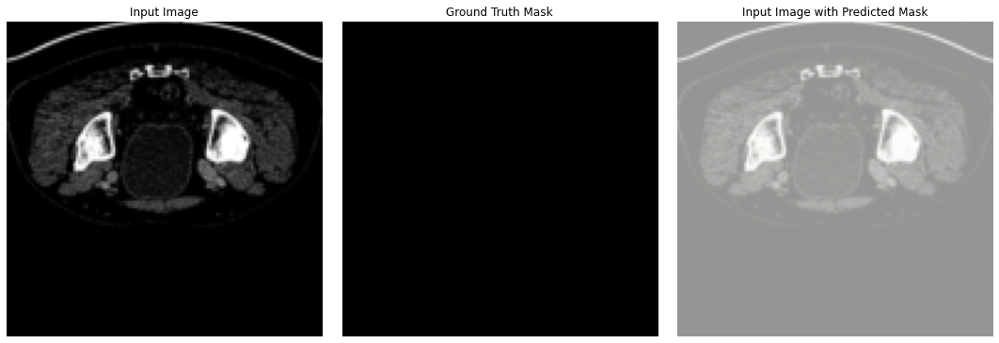

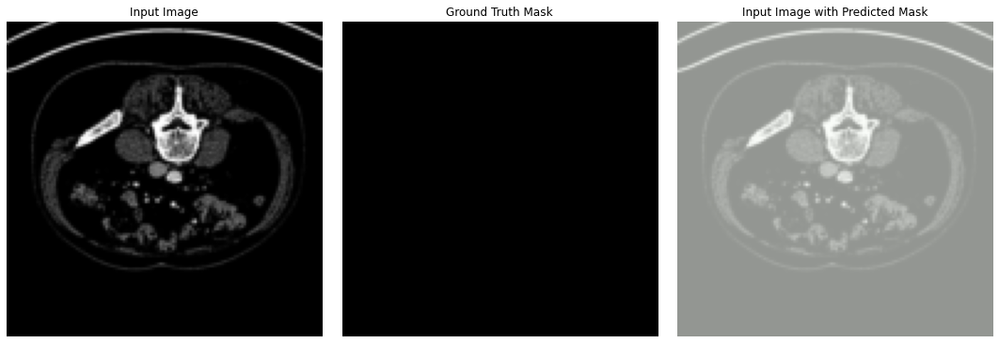

In [23]:
print_saved_files()

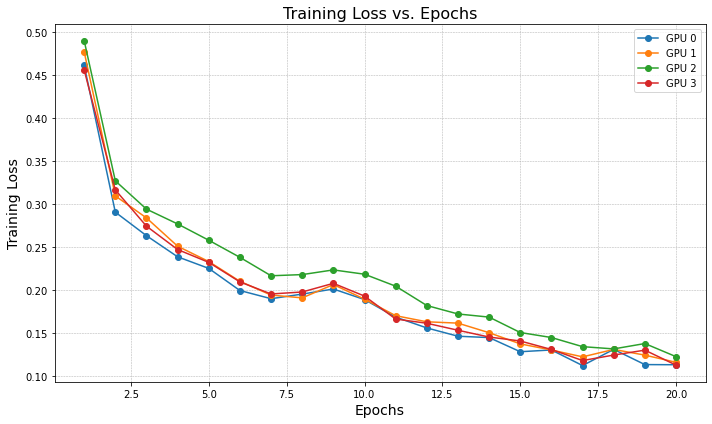

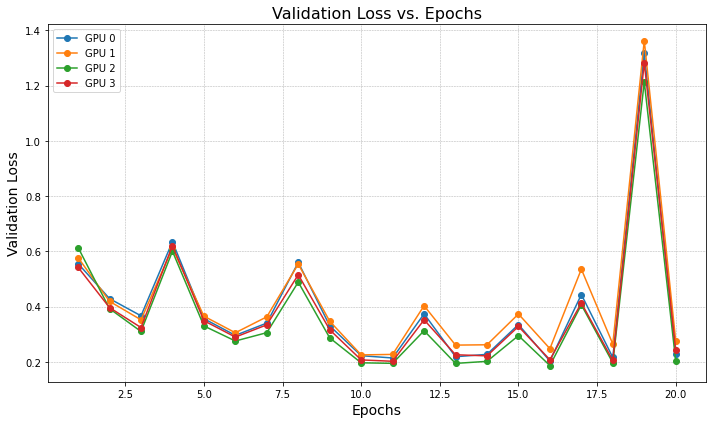

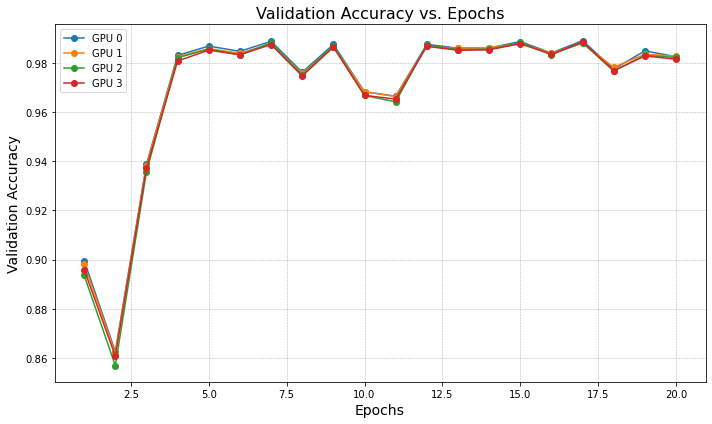

In [24]:
import matplotlib.pyplot as plt
import json
import os

def load_metrics(metrics_dir):
    """
    Load metrics from JSON files saved during training.

    Args:
        metrics_dir (str): Directory containing the JSON files with metrics.

    Returns:
        dict: A dictionary of metrics grouped by GPU rank.
    """
    metrics = {}
    for file_name in os.listdir(metrics_dir):
        if file_name.endswith('.json'):
            gpu_rank = int(file_name.split('_gpu')[1].split('.')[0])
            with open(os.path.join(metrics_dir, file_name), 'r') as f:
                metrics[gpu_rank] = json.load(f)
    return metrics

def plot_metrics(metrics):
    """
    Plot training and validation accuracy and loss with respect to the number of GPUs.

    Args:
        metrics (dict): Metrics collected during training, grouped by GPU rank.
    """
    num_gpus = len(metrics)
    epochs = len(next(iter(metrics.values()))['epochs'])

    gpu_train_losses = {gpu: [epoch['train_loss'] for epoch in data['epochs']] for gpu, data in metrics.items()}
    gpu_val_losses = {gpu: [epoch['val_loss'] for epoch in data['epochs']] for gpu, data in metrics.items()}
    gpu_val_accuracies = {gpu: [epoch['val_accuracy'] for epoch in data['epochs']] for gpu, data in metrics.items()}

    # Plot training loss
    plt.figure(figsize=(10, 6))
    for gpu, losses in gpu_train_losses.items():
        plt.plot(range(1, epochs + 1), losses, marker='o', linestyle='-', label=f"GPU {gpu}")
    plt.title("Training Loss vs. Epochs", fontsize=16)
    plt.xlabel("Epochs", fontsize=14)
    plt.ylabel("Training Loss", fontsize=14)
    plt.grid(True, linestyle='--', linewidth=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Plot validation loss
    plt.figure(figsize=(10, 6))
    for gpu, losses in gpu_val_losses.items():
        plt.plot(range(1, epochs + 1), losses, marker='o', linestyle='-', label=f"GPU {gpu}")
    plt.title("Validation Loss vs. Epochs", fontsize=16)
    plt.xlabel("Epochs", fontsize=14)
    plt.ylabel("Validation Loss", fontsize=14)
    plt.grid(True, linestyle='--', linewidth=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Plot validation accuracy
    plt.figure(figsize=(10, 6))
    for gpu, accuracies in gpu_val_accuracies.items():
        plt.plot(range(1, epochs + 1), accuracies, marker='o', linestyle='-', label=f"GPU {gpu}")
    plt.title("Validation Accuracy vs. Epochs", fontsize=16)
    plt.xlabel("Epochs", fontsize=14)
    plt.ylabel("Validation Accuracy", fontsize=14)
    plt.grid(True, linestyle='--', linewidth=0.5)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Example usage
metrics_directory = "results" 
metrics_data = load_metrics(metrics_directory)
plot_metrics(metrics_data)

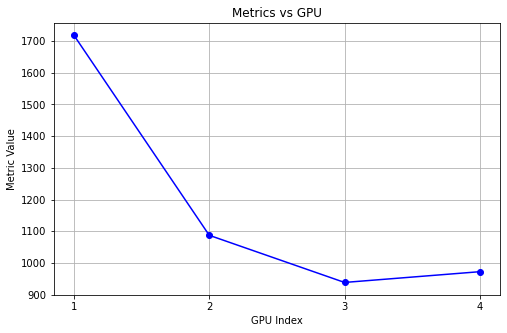

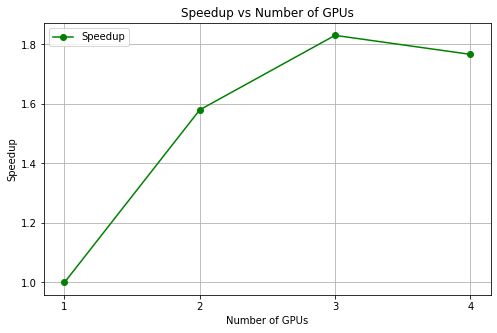

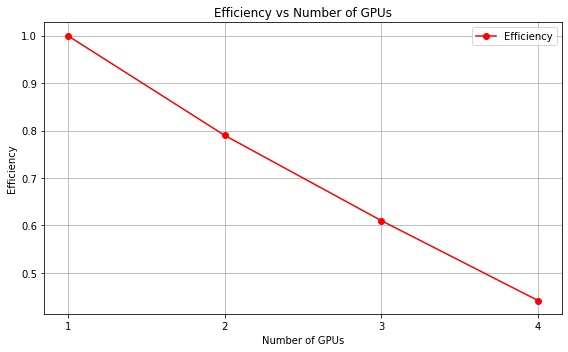

In [25]:
import json

# Load JSON data
file_path = 'metrics_gpu.json'
with open(file_path, 'r') as file:
    data = json.load(file)

wall_times = data[:4]  # Assuming the first 4 entries correspond to GPUs 1, 2, 3, 4
gpu_indices = range(1, 5)
# Calculate speedup and efficiency
speedups = [wall_times[0] / wall_time for wall_time in wall_times]
efficiencies = [speedup / (idx + 1) for idx, speedup in enumerate(speedups)]


plt.figure(figsize=(8, 5))
plt.plot(gpu_indices, wall_times, marker='o', linestyle='-', color='b')
plt.title("Metrics vs GPU")
plt.xlabel("GPU Index")
plt.ylabel("Metric Value")
plt.grid(True)
plt.xticks(gpu_indices)  # Ensure all GPUs are labeled
plt.show()

# Plot speedup and efficiency
plt.figure(figsize=(8, 5))

# Plot speedup
plt.plot(range(1, 5), speedups, marker='o', linestyle='-', color='g', label="Speedup")
plt.title("Speedup vs Number of GPUs")
plt.xlabel("Number of GPUs")
plt.ylabel("Speedup")
plt.xticks(range(1, 5))
plt.grid(True)
plt.legend()

# Plot efficiency
plt.figure(figsize=(8, 5))
plt.plot(range(1, 5), efficiencies, marker='o', linestyle='-', color='r', label="Efficiency")
plt.title("Efficiency vs Number of GPUs")
plt.xlabel("Number of GPUs")
plt.ylabel("Efficiency")
plt.xticks(range(1, 5))
plt.grid(True)
plt.legend()

# Show plots
plt.tight_layout()
plt.show()


## Model Parallelism
 The model is divided into different segments (e.g., layers or blocks), and each segment is assigned to a different device. During the forward pass, the output of one segment is transferred to the next segment on a different device. Similarly, during the backward pass, gradients are propagated back across devices.

In [ ]:
!CUDA_LAUNCH_BLOCKING=1 python unet-model_parallelism.py

Running on the GPU
running on 1 GPU
Data Loaded Successfully!
Epoch: 1/10
100%|███████████████████████████████████████████| 76/76 [00:44<00:00,  1.72it/s]
Train loss: 0.4587319791316986
Epoch completed and model successfully saved!
Epoch: 2/10
100%|███████████████████████████████████████████| 76/76 [00:39<00:00,  1.92it/s]
Train loss: 0.3912513256072998
Epoch completed and model successfully saved!
Epoch: 3/10
100%|███████████████████████████████████████████| 76/76 [00:40<00:00,  1.86it/s]
Train loss: 0.11027635633945465
Epoch completed and model successfully saved!
Epoch: 4/10
100%|███████████████████████████████████████████| 76/76 [00:38<00:00,  1.95it/s]
Train loss: 0.18439923226833344
Epoch completed and model successfully saved!
Epoch: 5/10
100%|███████████████████████████████████████████| 76/76 [00:41<00:00,  1.85it/s]
Train loss: 0.5132244825363159
Epoch completed and model successfully saved!
Epoch: 6/10
100%|███████████████████████████████████████████| 76/76 [00:41<00:00,  1.8

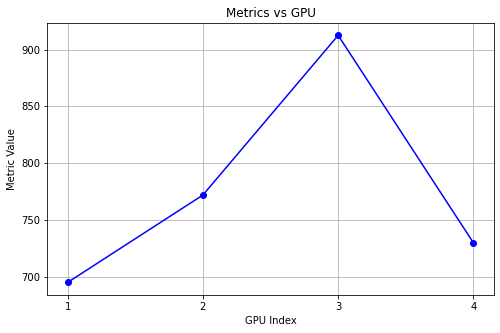

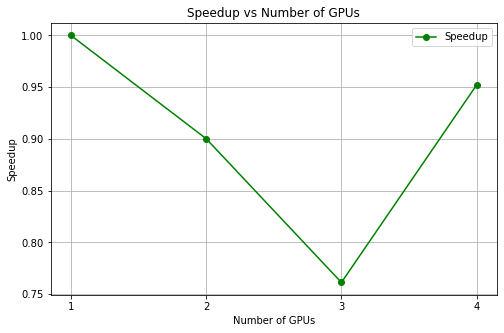

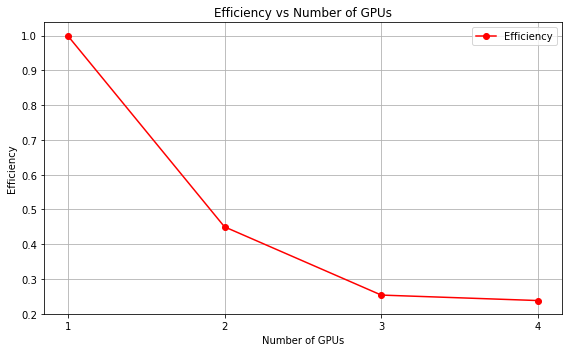

In [27]:
import json
import matplotlib.pyplot as plt

# Load JSON data
file_path = 'metrics_model_parallelism.json'
with open(file_path, 'r') as file:
    data = json.load(file)

wall_times = data[:4]  # Assuming the first 4 entries correspond to GPUs 1, 2, 3, 4
gpu_indices = range(1, 5)
# Calculate speedup and efficiency
speedups = [wall_times[0] / wall_time for wall_time in wall_times]
efficiencies = [speedup / (idx + 1) for idx, speedup in enumerate(speedups)]


plt.figure(figsize=(8, 5))
plt.plot(gpu_indices, wall_times, marker='o', linestyle='-', color='b')
plt.title("Metrics vs GPU")
plt.xlabel("GPU Index")
plt.ylabel("Metric Value")
plt.grid(True)
plt.xticks(gpu_indices)  # Ensure all GPUs are labeled
plt.show()

# Plot speedup and efficiency
plt.figure(figsize=(8, 5))

# Plot speedup
plt.plot(range(1, 5), speedups, marker='o', linestyle='-', color='g', label="Speedup")
plt.title("Speedup vs Number of GPUs")
plt.xlabel("Number of GPUs")
plt.ylabel("Speedup")
plt.xticks(range(1, 5))
plt.grid(True)
plt.legend()

# Plot efficiency
plt.figure(figsize=(8, 5))
plt.plot(range(1, 5), efficiencies, marker='o', linestyle='-', color='r', label="Efficiency")
plt.title("Efficiency vs Number of GPUs")
plt.xlabel("Number of GPUs")
plt.ylabel("Efficiency")
plt.xticks(range(1, 5))
plt.grid(True)
plt.legend()

# Show plots
plt.tight_layout()
plt.show()
